# Autoencoder Training Pipeline Demo

This notebook demonstrates how to use the model pipeline to train and validate a convolutional autoencoder on concentration maps from spectral unmixing results.

## Overview

The pipeline includes:
- Configurable model architecture
- Data loading and splitting
- Training loop with validation
- Checkpointing and model saving
- Evaluation metrics
- Wandb logging

In [1]:
import sys
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import torch
import random

# Add src to path
sys.path.append('..')

from src.models.pipeline.model_pipeline import ModelPipeline
from src.dataset.concentrations_dataset import ConcentrationsDataset
from src.dataset.fused_helicoid_concentration_dataset import FusedHelicoidConcentrationDataset
from src.wavelength_selection.enums import SampleType
from src.visualize_data import plot_interactive_reconstruction

Loaded 61 patient IDs from metadata CSV


## 1. Setup Data Paths

First, let's set up the paths to our concentration map data. You'll need to adjust these paths to match your actual data directories.

In [2]:
# Example paths - adjust these to your actual data
reduced_wl_dir = (
    "../results/helicoid_spectral_unmixing/coarseness_1_left_530_right_750_reduced"
)
gt_dir = "../results/helicoid_spectral_unmixing/coarseness_1_left_530_right_750"

# Check if directories exist
print(f"Reduced WL dir exists: {Path(reduced_wl_dir).exists()}")
print(f"GT dir exists: {Path(gt_dir).exists()}")

if Path(reduced_wl_dir).exists() and Path(gt_dir).exists():
    # Quick look at the dataset
    dataset = ConcentrationsDataset(
        reduced_wl_dir,
        gt_dir,
        sample_type=SampleType.HELICOID,
        normalization_dir="../results/statistics/helicoid",
        inference_mode=True,
    )
    summary = dataset.get_summary()
    print(f"\nDataset summary:")
    for key, value in summary.items():
        print(f"  {key}: {value}")
else:
    print("\nPlease adjust the paths above to match your data directories.")

2025-10-31 10:38:40.031 | DEBUG    | src.dataset.concentrations_dataset:_load_stats_from_dir:585 - ground truth - Loaded coef channels: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2025-10-31 10:38:40.032 | DEBUG    | src.dataset.concentrations_dataset:_load_stats_from_dir:586 - ground truth - Coef means range: [-4.622947, 0.043009]
2025-10-31 10:38:40.033 | DEBUG    | src.dataset.concentrations_dataset:_load_stats_from_dir:589 - ground truth - Coef stds range: [0.004007, 58.396553]
2025-10-31 10:38:40.036 | DEBUG    | src.dataset.concentrations_dataset:_load_stats_from_dir:630 - ground truth - Loaded scatter channels: [0, 1]
2025-10-31 10:38:40.037 | DEBUG    | src.dataset.concentrations_dataset:_load_stats_from_dir:633 - ground truth - Scatter means range: [24.273211, 24.274626]
2025-10-31 10:38:40.032 | DEBUG    | src.dataset.concentrations_dataset:_load_stats_from_dir:586 - ground truth - Coef means range: [-4.622947, 0.043009]
2025-10-31 10:38:40.033 | DEBUG    | src.dataset.concentrations_data

Reduced WL dir exists: True
GT dir exists: True
Found 70 common samples between directories

Dataset summary:
  total_samples: 70
  num_patients: 40
  patient_ids: ['004', '005', '007', '008', '010', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '025', '026', '027', '028', '029', '030', '034', '035', '036', '037', '038', '039', '040', '041', '042', '043', '050', '051', '053', '054', '055', '056', '057', '058']
  patient_fov_counts: {'004': 1, '005': 1, '007': 1, '008': 2, '010': 1, '012': 2, '013': 1, '014': 1, '015': 1, '016': 5, '017': 1, '018': 2, '019': 1, '020': 1, '021': 3, '022': 3, '025': 1, '026': 1, '027': 1, '028': 3, '029': 2, '030': 1, '034': 3, '035': 2, '036': 2, '037': 4, '038': 1, '039': 2, '040': 2, '041': 2, '042': 3, '043': 3, '050': 1, '051': 1, '053': 1, '054': 1, '055': 2, '056': 2, '057': 1, '058': 1}
  sample_type: 0
  reduced_wl_dir: ../results/helicoid_spectral_unmixing/coarseness_1_left_530_right_750_reduced
  gt_dir: ../result

## 2. Create Configuration

Let's create a configuration for our autoencoder training. We'll start with a default configuration and then customize it.

In [3]:
from src.constants import HELICOID_VAL_SET, HELICOID_TEST_SET
from src.models.pipeline.config import create_default_config
from src.models.pipeline.config import ModelConfig

config = ModelConfig.from_json(
    "../results/models/sweep/helicoid-autoencoder/swinUNETR_15_wl_L1/driven-sweep-9/config.json"
)
config.experiment_name = "swinUNETR_15_wl_L1_longer_training"
config.output_dir = "../results/models"
config.num_epochs = 100
config.device = "cuda:0"
config.device_ids = [0]
config.evaluate_full_resolution = True
config.early_stopping_patience = 100

# Create default configuration
# config = create_default_config(
#     reduced_wl_dir=reduced_wl_dir,
#     gt_dir=gt_dir,
#     experiment_name="unet_weighted_ssim_image_norm",
#     output_dir="../results/models",
# )

# # Customize for notebook demo (smaller/faster)
# config.batch_size = 4  # Reduced from 4 to save memory
# config.num_epochs = 20  # Fewer epochs for demo
# config.autoencoder_type = "Unet"
# config.image_wise_normalization = True

# config.in_channels = 10
# # config.chosen_molecules = ['HB']

# config.final_activation = None
# config.encoder_channels = [64, 128, 256]
# config.base_channels = 64
# config.unet_depth = 5
# config.loss_weights = {
#     'alpha': 0.5
# }
# config.padding = 1
# config.kernel_size = 3
# config.stride = 2
# config.learning_rate = 0.002294992535267863  # Reduced learning rate for stability
# config.early_stopping_patience = 150
# config.checkpoint_interval = 5
# config.device = "cuda:3"
# config.device_ids = [3, 2]
# # config.split_ratios = (0.8, 0.1, 0.1)
# config.validation_ids = HELICOID_VAL_SET
# config.test_ids = HELICOID_TEST_SET
# config.save_checkpoints = False
# config.batch_print = 2  # Reduced from 4
# config.activation = "ELU"
# config.loss_function = "weighted_ssim_with_mse"
# config.project = "helicoid-autoencoder"
# config.sample_type = "helicoid"
# config.center_crop_size = (224, 224)  # Example crop size, adjust as needed
# config.log_coarseness = 1
# config.log_image_epoch = 1
# # config.normalization_dir = "../results/statistics/helicoid"

# config.deterministic = False
# config.with_wandb = True  # Disable wandb for testing

print("Configuration:")
print(f"  Experiment: {config.experiment_name}")
print(f"  Device: {config.device}")
print(f"  Batch size: {config.batch_size}")
print(f"  Epochs: {config.num_epochs}")
print(f"  Learning rate: {config.learning_rate}")
print(f"  UNet depth: {config.unet_depth}")
print(f"  Wandb enabled: {config.with_wandb}")
print(f"  Channels first: {config.channels_first}")
print(f"  Loss function: {config.loss_function}")
print(f"  Output dir: {config.output_dir}")

Configuration:
  Experiment: swinUNETR_15_wl_L1_longer_training
  Device: cuda:0
  Batch size: 4
  Epochs: 100
  Learning rate: 0.0015981902356965974
  UNet depth: 5
  Wandb enabled: True
  Channels first: False
  Loss function: L1
  Output dir: ../results/models


## 3. Initialize Pipeline

Create the model pipeline and set up all components.

In [4]:
# Create pipeline
pipeline = ModelPipeline(config)
pipeline.setup_all()
print(f"\nPipeline ready!")
print(f"Model parameters: {sum(p.numel() for p in pipeline.model.parameters()):,}")
print(f"Training batches: {len(pipeline.train_loader)}")
print(f"Validation batches: {len(pipeline.val_loader)}")
print(f"Test batches: {len(pipeline.test_loader)}")

2025-10-31 10:38:40.181 | INFO     | src.models.pipeline.model_pipeline:__init__:98 - Initialized ModelPipeline with config: swinUNETR_15_wl_L1_longer_training
2025-10-31 10:38:40.182 | INFO     | src.models.pipeline.model_pipeline:__init__:101 - Using device: cuda:0
2025-10-31 10:38:40.183 | INFO     | src.models.pipeline.model_pipeline:setup_all:136 - Setting up all components...
2025-10-31 10:38:40.182 | INFO     | src.models.pipeline.model_pipeline:__init__:101 - Using device: cuda:0
2025-10-31 10:38:40.183 | INFO     | src.models.pipeline.model_pipeline:setup_all:136 - Setting up all components...
2025-10-31 10:38:41.526 | INFO     | src.models.pipeline.model_factory:_create_swin_unetr:279 - Initialized SwinUNETR for autoencoder.
2025-10-31 10:38:41.526 | INFO     | src.models.pipeline.model_factory:_create_swin_unetr:279 - Initialized SwinUNETR for autoencoder.
2025-10-31 10:38:42.242 | INFO     | src.models.pipeline.model_factory:_log_model_info:336 - Model created with 114,652,

Found 70 common samples between directories
Found 54 common samples between directories
Found 4 common samples between directories
Found 12 common samples between directories

Pipeline ready!
Model parameters: 114,652,420
Training batches: 14
Validation batches: 4
Test batches: 12


## 4. Inspect Data

Let's look at a sample from our dataset to understand the data structure.

In [5]:
sample_batch = next(iter(pipeline.train_loader))

print("Sample batch structure:")
print(f"  Batch size: {len(sample_batch['id'])}")
print(f"  Sample IDs: {sample_batch['id']}")
print(f"  Patient IDs: {sample_batch['patient_id']}")
print(f"  FOVs: {sample_batch['fov']}")

# Check data shapes
gt_coef = sample_batch["gt"]["coef_list"]
reduced_coef = sample_batch["reduced_wl"]["coef_list"]
gt_scatter = sample_batch["gt"]["scatter_params"]
reduced_scatter = sample_batch["reduced_wl"]["scatter_params"]

print(f"\nData shapes:")
print(f"  GT coefficients: {gt_coef.shape}")
print(f"  Reduced WL coefficients: {reduced_coef.shape}")
print(f"  GT scatter params: {gt_scatter.shape}")
print(f"  Reduced WL scatter params: {reduced_scatter.shape}")

# Visualize first sample
sample_gt = gt_coef[0].numpy()  # (H, W, C)
sample_scatter = gt_scatter[0].numpy()

print(f"\nFirst sample statistics:")
print(f"  Min: {sample_gt.min():.4f}")
print(f"  Max: {sample_gt.max():.4f}")
print(f"  Mean: {sample_gt.mean():.4f}")
print(f"  Std: {sample_gt.std():.4f}")

print(f"\nFirst sample scatter parameters statistics:")
print(f"  Min: {sample_scatter.min():.4f}")
print(f"  Max: {sample_scatter.max():.4f}")
print(f"  Mean: {sample_scatter.mean():.4f}")
print(f"  Std: {sample_scatter.std():.4f}")

Sample batch structure:
  Batch size: 4
  Sample IDs: ['040-01', '041-02', '039-01', '036-02']
  Patient IDs: ['040', '041', '039', '036']
  FOVs: ['01', '02', '01', '02']

Data shapes:
  GT coefficients: torch.Size([4, 192, 192, 10])
  Reduced WL coefficients: torch.Size([4, 192, 192, 10])
  GT scatter params: torch.Size([4, 192, 192, 2])
  Reduced WL scatter params: torch.Size([4, 192, 192, 2])

First sample statistics:
  Min: -7.8226
  Max: 9.1486
  Mean: -0.0063
  Std: 0.8621

First sample scatter parameters statistics:
  Min: 0.1810
  Max: 33.5762
  Mean: 16.7416
  Std: 16.5453


## 5. Visualize Sample Data

Let's visualize some concentration maps to understand our data.

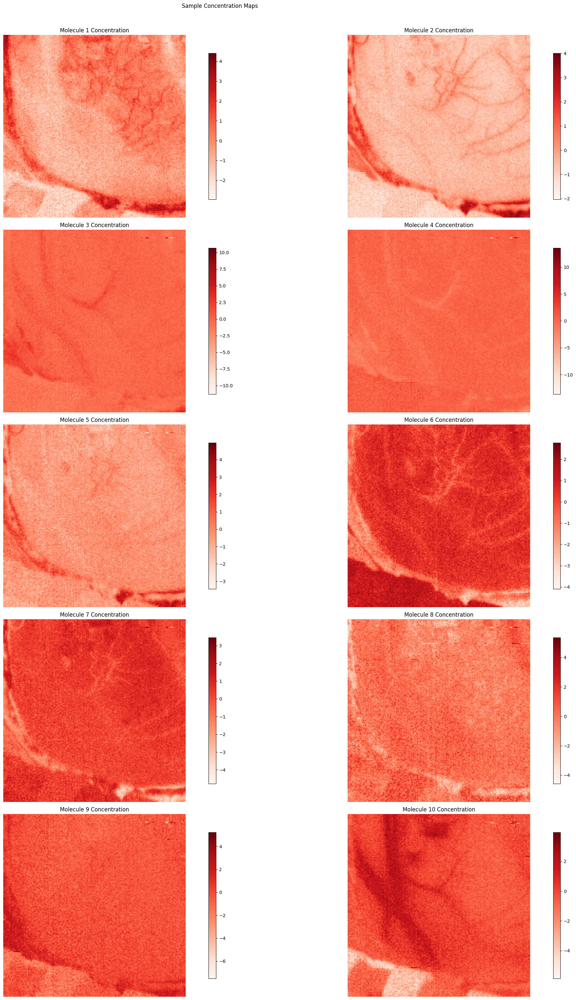

In [6]:
# Visualize concentration maps for first sample
sample_gt = reduced_coef[0].numpy()  # (H, W, C)
num_molecules = sample_gt.shape[2]
coarseness = 1  # Example coarseness factor, adjust as needed

# Plot first few molecule concentration maps
fig, axes = plt.subplots(5, 2, figsize=(25, 30))
axes = axes.flatten()

for i in range(min(10, num_molecules)):
    ax = axes[i]
    im = ax.imshow(sample_gt[::coarseness, ::coarseness, i], cmap='Reds')
    ax.set_title(f'Molecule {i+1} Concentration')
    ax.axis('off')
    plt.colorbar(im, ax=ax, shrink=0.8)

# Hide unused subplots
for i in range(min(6, num_molecules), 6):
    axes[i].axis('off')

plt.tight_layout()
plt.suptitle('Sample Concentration Maps', y=1.02)
plt.show()

## 6. Train the Model

Now let's train our autoencoder. This will take some time depending on your data size and hardware.

In [5]:
# Train the model
print("Starting training...")
pipeline.start_pipeline()

print(f"\nTraining completed!")
print(f"Best validation loss: {pipeline.best_val_loss:.6f}")
print(f"Results saved to: {pipeline.output_dir}")

2025-10-31 10:38:47.411 | INFO     | src.models.pipeline.model_pipeline:start_pipeline:406 - Starting model pipeline...


Starting training...


wandb: Currently logged in as: tim-mach (idp2024) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


2025-10-31 10:38:49.471 | INFO     | src.models.pipeline.model_pipeline:setup_all:136 - Setting up all components...
2025-10-31 10:38:50.539 | INFO     | src.models.pipeline.model_factory:_create_swin_unetr:279 - Initialized SwinUNETR for autoencoder.
2025-10-31 10:38:50.539 | INFO     | src.models.pipeline.model_factory:_create_swin_unetr:279 - Initialized SwinUNETR for autoencoder.
2025-10-31 10:38:50.658 | INFO     | src.models.pipeline.model_factory:_log_model_info:336 - Model created with 114,652,420 parameters (114,652,420 trainable)
2025-10-31 10:38:50.661 | INFO     | src.dataset.concentrations_dataset:__init__:177 - Image-wise normalization enabled using MONAI NormalizeIntensity
2025-10-31 10:38:50.667 | INFO     | src.models.pipeline.data_manager:setup_data:72 - Dataset summary: {'total_samples': 70, 'num_patients': 40, 'patient_ids': ['004', '005', '007', '008', '010', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '025', '026', '027', '028', '0

Found 70 common samples between directories
Found 54 common samples between directories
Found 4 common samples between directories
Found 12 common samples between directories


2025-10-31 10:38:52.190 | DEBUG    | src.models.pipeline.model_pipeline:train_epoch:174 - Epoch 1, Batch 0/14, Loss: 0.870084
2025-10-31 10:38:55.272 | DEBUG    | src.models.pipeline.model_pipeline:train_epoch:174 - Epoch 1, Batch 10/14, Loss: 0.457076
2025-10-31 10:38:55.272 | DEBUG    | src.models.pipeline.model_pipeline:train_epoch:174 - Epoch 1, Batch 10/14, Loss: 0.457076
2025-10-31 10:39:01.738 | INFO     | src.models.pipeline.model_pipeline:train:236 - Epoch 1/100 - Train Loss: 0.473117, Val Loss: 0.390033, Time: 11.05s
2025-10-31 10:39:01.743 | INFO     | src.models.pipeline.model_pipeline:train:252 - New best validation loss: 0.390033
2025-10-31 10:39:01.738 | INFO     | src.models.pipeline.model_pipeline:train:236 - Epoch 1/100 - Train Loss: 0.473117, Val Loss: 0.390033, Time: 11.05s
2025-10-31 10:39:01.743 | INFO     | src.models.pipeline.model_pipeline:train:252 - New best validation loss: 0.390033
2025-10-31 10:39:04.169 | INFO     | src.models.pipeline.checkpoint_manager:

epoch:,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▇▇▇█████
test/input_baseline/loss_input_data,▁
test/input_baseline/mae_input_data,▁
test/input_baseline/mse_input_data,▁
test/input_baseline/mse_per_channel/B_OXY,▁
test/input_baseline/mse_per_channel/B_RED,▁
test/input_baseline/mse_per_channel/COXA,▁
test/input_baseline/mse_per_channel/CREDA,▁
test/input_baseline/mse_per_channel/C_OXY,▁
test/input_baseline/mse_per_channel/C_RED,▁
test/input_baseline/mse_per_channel/FAT,▁


2025-10-31 10:52:32.907 | INFO     | src.models.pipeline.model_pipeline:start_pipeline:413 - Model pipeline completed.



Training completed!
Best validation loss: 0.315313
Results saved to: ../results/models/swinUNETR_15_wl_L1_longer_training


## 7. Plot Training Progress

Let's visualize the training and validation loss curves.

In [ ]:
# Plot training curves
plt.figure(figsize=(12, 5))

# Loss curves
plt.subplot(1, 2, 1)
epochs = range(1, len(pipeline.train_losses) + 1)
plt.plot(epochs, pipeline.train_losses, 'b-', label='Training Loss')
plt.plot(epochs, pipeline.val_losses, 'r-', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)

# Loss curves (log scale)
plt.subplot(1, 2, 2)
plt.semilogy(epochs, pipeline.train_losses, 'b-', label='Training Loss')
plt.semilogy(epochs, pipeline.val_losses, 'r-', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss (log scale)')
plt.title('Training and Validation Loss (Log Scale)')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

print(f"Final training loss: {pipeline.train_losses[-1]:.6f}")
print(f"Final validation loss: {pipeline.val_losses[-1]:.6f}")
print(f"Best validation loss: {pipeline.best_val_loss:.6f}")

## 8. Evaluate on Test Set

Let's evaluate our trained model on the test set to get final performance metrics.

In [ ]:
# Evaluate on test set
test_metrics = pipeline.evaluate(with_wandb=False)

print("Test Set Metrics:")
for metric, value in test_metrics.items():
    print(f"  {metric.upper()}: {value:.6f}")

## 9. Test Model Predictions

Let's test the model by making predictions on some samples and visualizing the results.

In [ ]:
# Get a test batch
test_batch = next(iter(pipeline.test_loader))
input = test_batch['reduced_wl']['coef_list']
gt_coef = test_batch['gt']['coef_list']

# Make predictions
with torch.no_grad():
    predictions = pipeline.predict(input.to('cuda:0').float())

# Convert to numpy for visualization
gt_np = gt_coef[0].numpy()  # First sample
pred_np = predictions[0].cpu().numpy()

print(f"Input shape: {gt_np.shape}")
print(f"Output shape: {pred_np.shape}")

# Calculate reconstruction error
reconstruction_error = np.abs(gt_np - pred_np)
mse_per_molecule = np.mean(reconstruction_error**2, axis=(0, 1))

print(f"\nReconstruction MSE per molecule:")
for i, mse in enumerate(mse_per_molecule):
    print(f"  Molecule {i+1}: {mse:.6f}")
print(f"Overall MSE: {np.mean(mse_per_molecule):.6f}")

## 10. Visualize Reconstruction Results

Let's compare the original and reconstructed concentration maps.

In [ ]:
# Visualize reconstruction for first few molecules
num_molecules_to_show = min(3, gt_np.shape[2])

fig, axes = plt.subplots(3, num_molecules_to_show, figsize=(15, 12))
if num_molecules_to_show == 1:
    axes = axes.reshape(-1, 1)

for i in range(num_molecules_to_show):
    # Original
    im1 = axes[0, i].imshow(gt_np[::8, ::8, i], cmap='viridis')
    axes[0, i].set_title(f'Original Molecule {i+1}')
    axes[0, i].axis('off')
    plt.colorbar(im1, ax=axes[0, i], shrink=0.8)
    
    # Reconstructed
    im2 = axes[1, i].imshow(pred_np[::8, ::8, i], cmap='viridis')
    axes[1, i].set_title(f'Reconstructed Molecule {i+1}')
    axes[1, i].axis('off')
    plt.colorbar(im2, ax=axes[1, i], shrink=0.8)
    
    # Error
    error_map = np.abs(gt_np[::8, ::8, i] - pred_np[::8, ::8, i])
    im3 = axes[2, i].imshow(error_map, cmap='Reds')
    axes[2, i].set_title(f'Absolute Error Molecule {i+1}')
    axes[2, i].axis('off')
    plt.colorbar(im3, ax=axes[2, i], shrink=0.8)

plt.tight_layout()
plt.suptitle('Autoencoder Reconstruction Results', y=1.02)
plt.show()

## 11. Save and Load Model

Let's demonstrate how to save configuration and load a trained model.

In [3]:
# Configuration and model are automatically saved during training
from src.models.pipeline.model_pipeline import load_model_pipeline

# load_from_path = Path(
#     "../results/models/sweep/helicoid-autoencoder/unet_autoencoder_SSIM_weighted/sweepy-sweep-30"
# )

wl_8_model = Path(
    "../results/models/sweep/helicoid-autoencoder/unet_8_wl_SSIM_with_L1_image_norm/dainty-sweep-10"
)

wl_12_model = Path(
    "../results/models/sweep/helicoid-autoencoder/unet_12_wl_adversarial_image_norm/distinctive-sweep-29"
)

wl_15_model = Path(
    "../results/models/sweep/helicoid-autoencoder/unet_15_wl_perceptual_image_norm/eager-sweep-2"
)

load_from_path = "../results/models/sweep/helicoid-autoencoder/autoencoder_baseline_15_wl/deep-sweep-33"


# Test loaded model
new_pipeline = load_model_pipeline(load_from_path, device="cuda:0")
# new_pipeline.data_manager.dataset.image_wise_normalization = True
# new_pipeline.data_manager.dataset.center_crop_size = (224,224)
# test_metrics_loaded = new_pipeline.evaluate(with_wandb=False, evaluate_on_full_res=True)
test_metrics_per_sample = new_pipeline.evaluate_individual_samples(evaluate_on_full_res=True)
for metric, value in test_metrics_per_sample.items():
    print(f"{metric}: {value}")



2025-10-31 15:28:31.116 | INFO     | src.models.pipeline.model_pipeline:__init__:98 - Initialized ModelPipeline with config: deep-sweep-33
2025-10-31 15:28:31.118 | INFO     | src.models.pipeline.model_pipeline:__init__:101 - Using device: cuda:0
2025-10-31 15:28:31.119 | INFO     | src.models.pipeline.model_pipeline:setup_all:136 - Setting up all components...
2025-10-31 15:28:33.000 | INFO     | src.models.pipeline.model_factory:_create_monai_autoencoder:147 - Initialized MONAI Autoencoder.
2025-10-31 15:28:33.177 | INFO     | src.models.pipeline.model_factory:_log_model_info:336 - Model created with 200,621,587 parameters (200,621,587 trainable)
2025-10-31 15:28:33.182 | DEBUG    | src.dataset.concentrations_dataset:_load_stats_from_dir:585 - ground truth - Loaded coef channels: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
2025-10-31 15:28:33.183 | DEBUG    | src.dataset.concentrations_dataset:_load_stats_from_dir:586 - ground truth - Coef means range: [-4.622947, 0.043009]
2025-10-31 15:28:33.18

Found 70 common samples between directories
Found 54 common samples between directories
Found 4 common samples between directories
Found 12 common samples between directories


2025-10-31 15:28:35.398 | INFO     | src.models.pipeline.checkpoint_manager:load_checkpoint:130 - Loaded checkpoint from epoch 87
2025-10-31 15:28:35.402 | INFO     | src.models.pipeline.model_pipeline:evaluate_individual_samples:337 - Evaluating individual samples on full resolution data...
2025-10-31 15:28:35.406 | INFO     | src.models.pipeline.evaluation_manager:evaluate_individual_samples:466 - Evaluating individual test samples
2025-10-31 15:28:39.743 | INFO     | src.models.pipeline.evaluation_manager:evaluate_individual_samples:659 - Evaluated 12 individual samples


008-01: {'mse': 0.25754493474960327, 'mae': 0.37338271737098694, 'ssim': 0.48658502101898193, 'psnr': 28.29767608642578, 'mse_baseline': 0.9027124643325806, 'mae_baseline': 0.7336438894271851, 'ssim_baseline': 0.23839272558689117, 'psnr_baseline': 22.850711822509766, 'mse_improvement_pct': 71.46987915039062, 'mae_improvement_pct': 49.105727672576904, 'ssim_improvement_pct': 104.11068325221515, 'psnr_improvement_pct': 23.83717542903991, 'mse_per_channel/HBO2': 0.2625041604042053, 'mse_baseline_per_channel/HBO2': 0.8630524277687073, 'mse_improvement_per_channel/HBO2': 69.58421468734741, 'mse_per_channel/HB': 0.059632807970047, 'mse_baseline_per_channel/HB': 0.5182937383651733, 'mse_improvement_per_channel/HB': 88.49440217018127, 'mse_per_channel/COXA': 0.27266812324523926, 'mse_baseline_per_channel/COXA': 1.005441665649414, 'mse_improvement_per_channel/COXA': 72.88076281547546, 'mse_per_channel/CREDA': 0.5341317057609558, 'mse_baseline_per_channel/CREDA': 1.4795111417770386, 'mse_improve

### Test effect of sliding window

In [ ]:
# Configuration and model are automatically saved during training
from src.models.pipeline.model_pipeline import load_model_pipeline
import matplotlib.pyplot as plt

# load_from_path = Path(
#     "../results/models/sweep/helicoid-autoencoder/unet_autoencoder_SSIM_weighted/sweepy-sweep-30"
# )

load_from_path = wl_12_model
# Test loaded model
new_pipeline = load_model_pipeline(load_from_path, device="cuda:2")
new_pipeline.config.inferer_mode = "sliding_window"

mse = []


sliding_window_overlaps = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
sliding_window_roi_sizes = [
    (192, 192),
    (200, 200),
    (208, 208),
    (216, 216),
    (224, 224),
]

plt.figure(figsize=(8, 6))

for roi_size in sliding_window_roi_sizes:
    new_pipeline.config.sliding_window_roi_size = roi_size

    mse_values = []
    for overlap in sliding_window_overlaps:
        new_pipeline.config.sliding_window_overlap = overlap
        metrics = new_pipeline.evaluate(with_wandb=False, evaluate_on_full_res=True)
        mse_values.append(metrics["test/mse"])

    plt.plot(
        sliding_window_overlaps,
        mse_values,
        marker="o",
        label=f"ROI {roi_size[0]}×{roi_size[1]}",
    )

# Styling
plt.xlabel("Sliding Window Overlap", fontsize=12)
plt.ylabel("Test MSE", fontsize=12)
plt.title("Effect of Sliding Window Parameters on Test MSE (constant mode)", fontsize=14)
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(title="ROI Window Size", fontsize=10)
plt.tight_layout()
plt.show()

2025-10-24 19:50:51.751 | INFO     | src.models.pipeline.model_pipeline:__init__:97 - Initialized ModelPipeline with config: distinctive-sweep-29
2025-10-24 19:50:51.753 | INFO     | src.models.pipeline.model_pipeline:__init__:100 - Using device: cuda:2
2025-10-24 19:50:51.753 | INFO     | src.models.pipeline.model_pipeline:setup_all:135 - Setting up all components...
2025-10-24 19:50:52.778 | INFO     | src.models.pipeline.model_factory:_create_unet_autoencoder:170 - Initialized UnetAutoencoder with base channels 64
2025-10-24 19:50:53.093 | INFO     | src.models.pipeline.model_factory:_log_model_info:336 - Model created with 101,312,970 parameters (101,312,970 trainable)
2025-10-24 19:50:53.095 | INFO     | src.dataset.concentrations_dataset:__init__:177 - Image-wise normalization enabled using MONAI NormalizeIntensity
2025-10-24 19:50:53.099 | INFO     | src.models.pipeline.data_manager:setup_data:72 - Dataset summary: {'total_samples': 70, 'num_patients': 40, 'patient_ids': ['004',

Found 70 common samples between directories
Found 54 common samples between directories
Found 4 common samples between directories
Found 12 common samples between directories


2025-10-24 19:50:54.507 | INFO     | src.models.pipeline.checkpoint_manager:load_checkpoint:130 - Loaded checkpoint from epoch 20
2025-10-24 19:50:54.517 | INFO     | src.models.pipeline.model_pipeline:evaluate:307 - Evaluating on full resolution data...
2025-10-24 19:50:54.520 | INFO     | src.models.pipeline.evaluation_manager:evaluate:77 - Evaluating on full resolution
2025-10-24 19:50:56.853 | INFO     | src.models.pipeline.evaluation_manager:evaluate:232 - Evaluation metrics: {'test/loss': 0.2441609501838684, 'test/mse': 0.24249685058991113, 'test/mae': 0.3510799656311671, 'test/ssim': 0.7541749452551206, 'test/psnr': 35.11762269337972, 'test/std/mse': 0.08508643594299364, 'test/std/mae': 0.06762786630857887, 'test/std/ssim': 0.10735298663594194, 'test/std/psnr': 3.6666282025925723, 'test/input_baseline/loss_input_data': 0.8016599317391714, 'test/input_baseline/mse_input_data': 1.0233066429694493, 'test/input_baseline/mae_input_data': 0.7608865946531296, 'test/input_baseline/ssim_

### Visualize

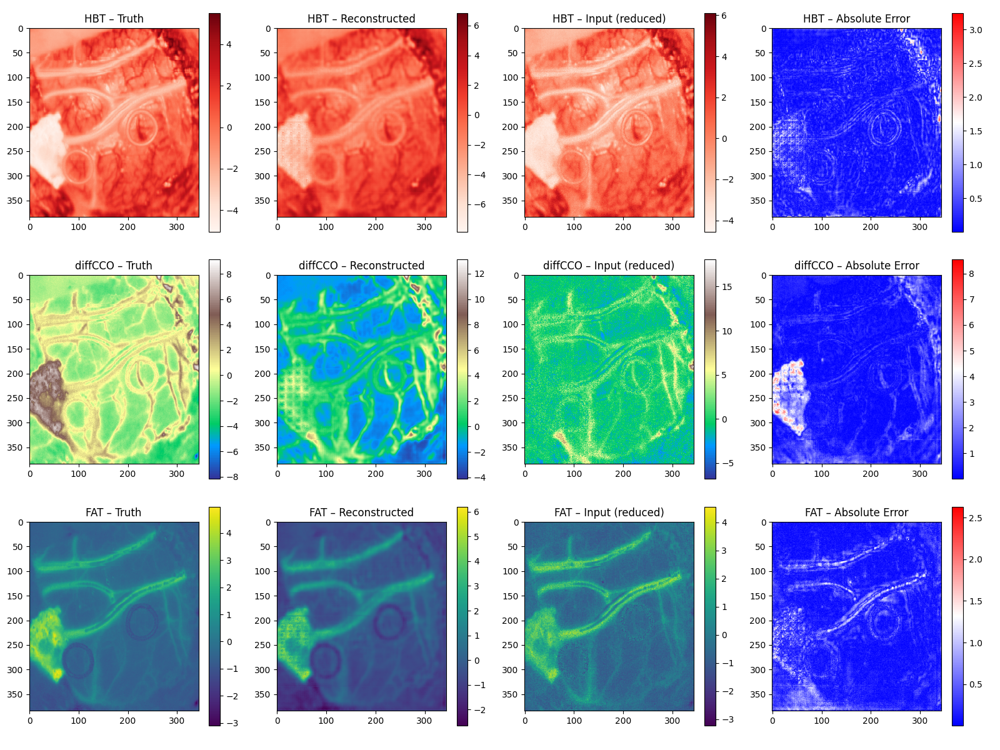

In [3]:
%matplotlib widget
dataset = new_pipeline.data_manager.dataset
# dataset.set_inference_mode(False)
dataset.set_inference_mode(True)
plot_interactive_reconstruction(
    dataset=dataset,
    model_pipeline=new_pipeline,
    coarseness=1,
)

### Benchmark Speed

In [6]:
statistics = new_pipeline.benchmark_inference(sample_id="012-02", n_runs=100, n_warmup=10)
print(new_pipeline.data_manager.dataset.get_sample_by_id("012-02").reduced_wl['coef_list'].shape)
print("Inference Benchmark Statistics:")
for key, value in statistics.items():
    print(f"  {key}: {value:.6f}")

(445, 498, 10)
Inference Benchmark Statistics:
  avg_ms: 56.477540
  p50_ms: 56.387041
  p90_ms: 56.958721
  runs: 100.000000


### Evaluate 15 WL Reconstruction

In [ ]:
from src.models.pipeline.model_pipeline import load_model_pipeline
import pandas as pd
import numpy as np
import torch
paths = {
    # Baseline
    "Autoencoder": "../results/models/sweep/helicoid-autoencoder/autoencoder_baseline_15_wl/deep-sweep-33",
    # Unet
    "U-Net_MSE": "../results/models/sweep/helicoid-autoencoder/unet_15_wl_MSE_image_norm/cosmic-sweep-47",
    "U-Net_L1": "../results/models/sweep/helicoid-autoencoder/unet_15_wl_L1_image_norm/lunar-sweep-17",
    "U-Net_MSE+L1": "../results/models/sweep/helicoid-autoencoder/unet_15_wl_weighted_MSE_image_norm/fresh-sweep-29",
    "U-Net_MSE+SSIM": "../results/models/sweep/helicoid-autoencoder/unet_15_wl_SSIM_with_MSE_image_norm/fallen-sweep-39",
    "U-Net_L1+SSIM": "../results/models/sweep/helicoid-autoencoder/unet_15_wl_SSIM_with_L1_image_norm/frosty-sweep-4",
    "U-Net_perceptual": "../results/models/sweep/helicoid-autoencoder/unet_15_wl_perceptual_image_norm/eager-sweep-2",
    "U-Net_adversarial": "../results/models/sweep/helicoid-autoencoder/unet_15_wl_adversarial_image_norm/worldly-sweep-7",
    # Swinunetr
    "Swin-UNETR_MSE": "../results/models/sweep/helicoid-autoencoder/swinUNETR_15_wl_MSE/devoted-sweep-21",
    "Swin-UNETR_L1": "../results/models/sweep/helicoid-autoencoder/swinUNETR_15_wl_L1/driven-sweep-9",
    "Swin-UNETR_MSE+L1": "../results/models/sweep/helicoid-autoencoder/swinUNETR_15_wl_weighted_MSE/wandering-sweep-45",
    "Swin-UNETR_MSE+SSIM": "../results/models/sweep/helicoid-autoencoder/swinUNETR_15_SSIM_MSE/flowing-sweep-26",
    "Swin-UNETR_L1+SSIM": "../results/models/sweep/helicoid-autoencoder/swinUNETR_15_SSIM_L1/volcanic-sweep-32",
    "Swin-UNETR_perceptual": "../results/models/sweep/helicoid-autoencoder/swinUNETR_15_wl_perceptual/restful-sweep-40",
    "Swin-UNETR_adversarial": "../results/models/sweep/helicoid-autoencoder/swinUNETR_15_wl_adversarial/polar-sweep-34",
}

test_metrics_all = {} 

for model_name, path in paths.items():
    print(f"\nEvaluating model: {model_name}")
    pipeline = load_model_pipeline(Path(path), device="cuda:0")
    test_metrics = pipeline.evaluate(with_wandb=False, evaluate_on_full_res=True)
    test_metrics_all[model_name] = test_metrics
    del pipeline  # Free up memory
    torch.cuda.empty_cache()

# Create a comprehensive results table
results_data = []

for model_name, metrics in test_metrics_all.items():
    # Extract main metrics
    mse = metrics["test/mse"]
    ssim = metrics["test/ssim"]
    psnr = metrics["test/psnr"]
    
    # Extract standard deviations
    mse_std = metrics["test/std/mse"]
    ssim_std = metrics["test/std/ssim"]
    psnr_std = metrics["test/std/psnr"]
    
    # Extract baseline metrics for improvement calculation
    mse_baseline = metrics["test/input_baseline/mse_input_data"]
    ssim_baseline = metrics["test/input_baseline/ssim_input_data"]
    psnr_baseline = metrics["test/input_baseline/psnr_input_data"]
    
    # Calculate improvements (lower is better for MSE, higher is better for SSIM and PSNR)
    mse_improvement = ((mse_baseline - mse) / mse_baseline) * 100
    ssim_improvement = ((ssim - ssim_baseline) / ssim_baseline) * 100
    psnr_improvement = ((psnr - psnr_baseline) / psnr_baseline) * 100
    
    results_data.append({
        'Model': model_name,
        'MSE': f"{mse:.3f} ± {mse_std:.3f}",
        'SSIM': f"{ssim:.3f} ± {ssim_std:.3f}",
        'PSNR': f"{psnr:.3f} ± {psnr_std:.3f}",
        'MSE_Improvement (%)': f"{mse_improvement:.1f}",
        'SSIM_Improvement (%)': f"{ssim_improvement:.1f}",
        'PSNR_Improvement (%)': f"{psnr_improvement:.1f}",
        # Raw values for sorting
        'MSE_raw': mse,
        'SSIM_raw': ssim,
        'PSNR_raw': psnr
    })

# Create DataFrame
df_results = pd.DataFrame(results_data)

# Sort by MSE (lower is better)
df_results = df_results.sort_values('MSE_raw')

# Display table (without raw values)
display_df = df_results[['Model', 'MSE', 'SSIM', 'PSNR', 'MSE_Improvement (%)', 'SSIM_Improvement (%)', 'PSNR_Improvement (%)']].copy()
print("\nModel Evaluation Results:")
print("=" * 120)
print(display_df.to_string(index=False, max_colwidth=20))

# Export to CSV
csv_filename = "./model_evaluation_results.csv"
display_df.to_csv(csv_filename, index=False)
print(f"\nResults exported to: {csv_filename}")

# Print some summary statistics
print(f"\nSummary:")
print(f"Best MSE: {df_results.iloc[0]['Model']} ({df_results.iloc[0]['MSE']})")
print(f"Best SSIM: {df_results.loc[df_results['SSIM_raw'].idxmax()]['Model']} ({df_results.loc[df_results['SSIM_raw'].idxmax()]['SSIM']})")
print(f"Best PSNR: {df_results.loc[df_results['PSNR_raw'].idxmax()]['Model']} ({df_results.loc[df_results['PSNR_raw'].idxmax()]['PSNR']})")

### Box Plot

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Prepare data for box plot
mse_data = []
model_labels = []

for model_name, metrics in test_metrics_all.items():
    mse_mean = metrics["test/mse"]
    mse_std = metrics["test/std/mse"]
    
    # Generate synthetic data points around the mean and std for box plot visualization
    # This simulates the distribution since we only have mean and std
    np.random.seed(42)  # For reproducibility
    n_samples = 100
    synthetic_data = np.random.normal(mse_mean, mse_std, n_samples)
    
    mse_data.extend(synthetic_data)
    model_labels.extend([model_name] * n_samples)

# Create a DataFrame for plotting
import pandas as pd
plot_df = pd.DataFrame({
    'Model': model_labels,
    'MSE': mse_data
})

# Sort models by mean MSE for better visualization
model_order = [model for model, _ in sorted(test_metrics_all.items(), 
                                          key=lambda x: x[1]["test/mse"])]

# Create the box plot
plt.figure(figsize=(16, 8))
sns.boxplot(data=plot_df, x='Model', y='MSE', order=model_order, palette='Set2')

# Customize the plot
plt.title('MSE Distribution Across Different Reconstruction Models', fontsize=16, fontweight='bold')
plt.xlabel('Model Architecture', fontsize=12)
plt.ylabel('Mean Squared Error (MSE)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(True, alpha=0.3, axis='y')

# Add mean values as red dots
for i, model in enumerate(model_order):
    mean_mse = test_metrics_all[model]["test/mse"]
    plt.plot(i, mean_mse, 'ro', markersize=8, markerfacecolor='red', 
             markeredgecolor='darkred', markeredgewidth=1, label='Mean' if i == 0 else "")

# Add a legend
plt.legend(loc='upper right')

# Adjust layout to prevent label cutoff
plt.tight_layout()
plt.show()

# Print the actual MSE values for reference
print("\nActual MSE Values (Mean ± Std):")
print("-" * 50)
for model in model_order:
    mse_mean = test_metrics_all[model]["test/mse"]
    mse_std = test_metrics_all[model]["test/std/mse"]
    print(f"{model:25s}: {mse_mean:.3f} ± {mse_std:.3f}")

# Create a simplified bar plot with error bars as alternative visualization
plt.figure(figsize=(16, 6))
models = list(model_order)
mse_means = [test_metrics_all[model]["test/mse"] for model in models]
mse_stds = [test_metrics_all[model]["test/std/mse"] for model in models]

bars = plt.bar(range(len(models)), mse_means, yerr=mse_stds, 
               capsize=5, alpha=0.7, color='skyblue', edgecolor='navy')

plt.title('MSE Comparison Across Reconstruction Models (with Error Bars)', fontsize=16, fontweight='bold')
plt.xlabel('Model Architecture', fontsize=12)
plt.ylabel('Mean Squared Error (MSE)', fontsize=12)
plt.xticks(range(len(models)), models, rotation=45, ha='right')
plt.grid(True, alpha=0.3, axis='y')

# Add value labels on top of bars
for i, (mean, std) in enumerate(zip(mse_means, mse_stds)):
    plt.text(i, mean + std + 0.001, f'{mean:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

### Per-Channel MSE

In [3]:
import pandas as pd
import numpy as np

# Get molecule names from the first model's metrics
first_model_metrics = list(test_metrics_all.values())[0]
molecule_names = []

# Extract molecule names from the metric keys
for key in first_model_metrics.keys():
    if key.startswith("test/mse_per_channel/"):
        molecule_name = key.replace("test/mse_per_channel/", "")
        molecule_names.append(molecule_name)

print(f"Found {len(molecule_names)} molecules: {molecule_names}")

# Create table data
table_data = []

# For each model, create a row with MSE values and improvements
for model_name, metrics in test_metrics_all.items():
    row_data = {'Model': model_name}
    
    # Add MSE values and improvements for each molecule
    for molecule in molecule_names:
        mse_key = f"test/mse_per_channel/{molecule}"
        baseline_key = f"test/input_baseline/mse_per_channel/{molecule}"
        
        if mse_key in metrics and baseline_key in metrics:
            mse_value = metrics[mse_key]
            baseline_value = metrics[baseline_key]
            
            # Calculate relative improvement (percentage)
            improvement = ((baseline_value - mse_value) / baseline_value) * 100
            
            # Format as "MSE (improvement%)"
            row_data[molecule] = f"{mse_value:.3f} ({improvement:+.1f}%)"
        else:
            row_data[molecule] = "N/A"
    
    table_data.append(row_data)

# Create DataFrame
df_per_channel = pd.DataFrame(table_data)

# Sort by overall model performance (using the first molecule as proxy, or you could use average)
if molecule_names:
    # Extract numeric MSE values for sorting
    first_molecule = molecule_names[0]
    mse_values = []
    for _, row in df_per_channel.iterrows():
        mse_str = row[first_molecule]
        if mse_str != "N/A":
            mse_val = float(mse_str.split(' ')[0])
            mse_values.append(mse_val)
        else:
            mse_values.append(float('inf'))
    
    df_per_channel['_sort_key'] = mse_values
    df_per_channel = df_per_channel.sort_values('_sort_key').drop('_sort_key', axis=1)

# Display the table
print("\nPer-Channel MSE Results (MSE with Relative Improvement %):")
print("=" * 150)
print(df_per_channel.to_string(index=False, max_colwidth=25))

# Export to CSV
csv_filename = "./per_channel_mse_results.csv"
df_per_channel.to_csv(csv_filename, index=False)
print(f"\nPer-channel results exported to: {csv_filename}")

# Create a summary showing which model performs best for each molecule
print("\nBest Model per Molecule:")
print("-" * 40)
for molecule in molecule_names:
    best_mse = float('inf')
    best_model = "N/A"
    
    for _, row in df_per_channel.iterrows():
        mse_str = row[molecule]
        if mse_str != "N/A":
            mse_val = float(mse_str.split(' ')[0])
            if mse_val < best_mse:
                best_mse = mse_val
                best_model = row['Model']
    
    print(f"{molecule:15s}: {best_model} (MSE: {best_mse:.3f})")

# Calculate average improvement across all molecules for each model
print("\nAverage Improvement per Model:")
print("-" * 40)
for _, row in df_per_channel.iterrows():
    improvements = []
    for molecule in molecule_names:
        mse_str = row[molecule]
        if mse_str != "N/A" and '(' in mse_str:
            # Extract improvement percentage
            improvement_str = mse_str.split('(')[1].split('%')[0]
            improvements.append(float(improvement_str))
    
    if improvements:
        avg_improvement = np.mean(improvements)
        print(f"{row['Model']:25s}: {avg_improvement:+.1f}%")

Found 10 molecules: ['HBO2', 'HB', 'COXA', 'CREDA', 'C_OXY', 'C_RED', 'B_OXY', 'B_RED', 'WATER', 'FAT']

Per-Channel MSE Results (MSE with Relative Improvement %):
                 Model           HBO2             HB           COXA          CREDA          C_OXY          C_RED          B_OXY          B_RED          WATER            FAT
        U-Net_MSE+SSIM 0.082 (+82.7%) 0.113 (+76.0%) 0.136 (+85.8%) 0.242 (+80.1%) 0.378 (+72.5%) 0.131 (+77.1%) 0.376 (+71.3%) 0.375 (+63.4%) 0.318 (+72.4%) 0.186 (+71.8%)
         U-Net_L1+SSIM 0.082 (+82.8%) 0.110 (+76.9%) 0.126 (+86.9%) 0.234 (+80.8%) 0.372 (+72.9%) 0.127 (+77.8%) 0.378 (+71.2%) 0.378 (+63.1%) 0.344 (+70.2%) 0.190 (+71.3%)
     U-Net_adversarial 0.084 (+82.4%) 0.113 (+76.2%) 0.137 (+85.7%) 0.250 (+79.4%) 0.377 (+72.5%) 0.132 (+76.9%) 0.376 (+71.3%) 0.368 (+64.0%) 0.317 (+72.5%) 0.189 (+71.4%)
      U-Net_perceptual 0.085 (+82.1%) 0.111 (+76.5%) 0.133 (+86.1%) 0.235 (+80.7%) 0.361 (+73.7%) 0.127 (+77.8%) 0.364 (+72.2%) 0.367 (+64.2%) 0

### Qualitative Evaluation

In [4]:
from src.models.pipeline.model_pipeline import load_model_pipeline
import pandas as pd
import numpy as np
import torch

# Load the two models for comparison
unet_pipeline = load_model_pipeline(
    "../results/models/sweep/helicoid-autoencoder/unet_15_wl_perceptual_image_norm/eager-sweep-2",
    device="cuda:0",
)
autoencoder_pipeline = load_model_pipeline(
    "../results/models/sweep/helicoid-autoencoder/autoencoder_baseline_15_wl/deep-sweep-33",
    device="cuda:1",
)

# Evaluate individual samples for both models
print("Evaluating U-Net individual samples...")
test_metrics_unet = unet_pipeline.evaluate_individual_samples(evaluate_on_full_res=True)

print("Evaluating Autoencoder individual samples...")
test_metrics_autoencoder = autoencoder_pipeline.evaluate_individual_samples(evaluate_on_full_res=True)

# Create comparison table
table_data = []

# Get all sample IDs (should be the same for both models)
sample_ids = sorted(test_metrics_unet.keys())

for sample_id in sample_ids:
    # Get metrics for both models
    unet_metrics = test_metrics_unet[sample_id]
    autoencoder_metrics = test_metrics_autoencoder[sample_id]
    
    # Extract MSE values
    unet_mse = unet_metrics["mse"]
    unet_baseline = unet_metrics["mse_baseline"]
    autoencoder_mse = autoencoder_metrics["mse"]
    autoencoder_baseline = autoencoder_metrics["mse_baseline"]
    
    # Calculate improvements (percentage reduction from baseline)
    unet_improvement = ((unet_baseline - unet_mse) / unet_baseline) * 100
    autoencoder_improvement = ((autoencoder_baseline - autoencoder_mse) / autoencoder_baseline) * 100
    
    # Create row data
    row_data = {
        'Sample_ID': sample_id,
        'MSE_Autoencoder': f"{autoencoder_mse:.3f} ({autoencoder_improvement:+.1f}%)",
        'MSE_U-Net': f"{unet_mse:.3f} ({unet_improvement:+.1f}%)",
        'Input': f"{unet_baseline:.3f}",  # Using baseline from either model (should be the same)
        # Raw values for sorting
        '_autoencoder_mse': autoencoder_mse,
        '_unet_mse': unet_mse,
        '_baseline_mse': unet_baseline
    }
    
    table_data.append(row_data)

# Create DataFrame
df_comparison = pd.DataFrame(table_data)

# Sort by baseline MSE (showing hardest samples first)
df_comparison = df_comparison.sort_values('_baseline_mse', ascending=False)

# Display table (without raw sorting values)
display_df = df_comparison[['Sample_ID', 'MSE_Autoencoder', 'MSE_U-Net', 'Input']].copy()

print("\nQualitative Sample-by-Sample MSE Comparison:")
print("=" * 80)
print(display_df.to_string(index=False, max_colwidth=25))

# Export to CSV
csv_filename = "./qualitative_sample_comparison.csv"
display_df.to_csv(csv_filename, index=False)
print(f"\nComparison results exported to: {csv_filename}")

# Calculate summary statistics
print(f"\nSummary Statistics:")
print(f"Number of samples: {len(sample_ids)}")

# Count samples where each model performs better
unet_better_count = 0
autoencoder_better_count = 0
for _, row in df_comparison.iterrows():
    if row['_unet_mse'] < row['_autoencoder_mse']:
        unet_better_count += 1
    else:
        autoencoder_better_count += 1

print(f"U-Net performs better on: {unet_better_count}/{len(sample_ids)} samples ({unet_better_count/len(sample_ids)*100:.1f}%)")
print(f"Autoencoder performs better on: {autoencoder_better_count}/{len(sample_ids)} samples ({autoencoder_better_count/len(sample_ids)*100:.1f}%)")

# Show best and worst performing samples for each model
print(f"\nBest U-Net samples (lowest MSE):")
best_unet = df_comparison.nsmallest(3, '_unet_mse')[['Sample_ID', 'MSE_U-Net', 'Input']]
print(best_unet.to_string(index=False))

print(f"\nWorst U-Net samples (highest MSE):")
worst_unet = df_comparison.nlargest(3, '_unet_mse')[['Sample_ID', 'MSE_U-Net', 'Input']]
print(worst_unet.to_string(index=False))

print(f"\nBest Autoencoder samples (lowest MSE):")
best_autoencoder = df_comparison.nsmallest(3, '_autoencoder_mse')[['Sample_ID', 'MSE_Autoencoder', 'Input']]
print(best_autoencoder.to_string(index=False))

print(f"\nWorst Autoencoder samples (highest MSE):")
worst_autoencoder = df_comparison.nlargest(3, '_autoencoder_mse')[['Sample_ID', 'MSE_Autoencoder', 'Input']]
print(worst_autoencoder.to_string(index=False))

# Clean up memory
del unet_pipeline, autoencoder_pipeline
torch.cuda.empty_cache()

2025-10-31 15:49:59.019 | INFO     | src.models.pipeline.model_pipeline:__init__:98 - Initialized ModelPipeline with config: eager-sweep-2
2025-10-31 15:49:59.020 | INFO     | src.models.pipeline.model_pipeline:__init__:101 - Using device: cuda:0
2025-10-31 15:49:59.021 | INFO     | src.models.pipeline.model_pipeline:setup_all:136 - Setting up all components...
2025-10-31 15:49:59.020 | INFO     | src.models.pipeline.model_pipeline:__init__:101 - Using device: cuda:0
2025-10-31 15:49:59.021 | INFO     | src.models.pipeline.model_pipeline:setup_all:136 - Setting up all components...
2025-10-31 15:49:59.858 | INFO     | src.models.pipeline.model_factory:_create_unet_autoencoder:170 - Initialized UnetAutoencoder with base channels 64
2025-10-31 15:49:59.858 | INFO     | src.models.pipeline.model_factory:_create_unet_autoencoder:170 - Initialized UnetAutoencoder with base channels 64
2025-10-31 15:49:59.954 | INFO     | src.models.pipeline.model_factory:_log_model_info:336 - Model created 

Found 70 common samples between directories
Found 54 common samples between directories
Found 4 common samples between directories
Found 12 common samples between directories


2025-10-31 15:50:01.188 | INFO     | src.models.pipeline.training_manager:get_perceptual_monai_loss:199 - Using MONAI's perceptual loss with radimagenet_resnet50 features.
2025-10-31 15:50:01.192 | INFO     | src.models.pipeline.training_manager:setup_train_step:342 - Using standard autoencoder training step.
2025-10-31 15:50:01.193 | INFO     | src.models.pipeline.training_manager:setup_training:69 - Training setup complete - Optimizer: Adam, Scheduler: StepLR, Loss: perceptualMonai
2025-10-31 15:50:01.194 | INFO     | src.models.pipeline.model_pipeline:setup_all:151 - Pipeline setup complete
2025-10-31 15:50:01.192 | INFO     | src.models.pipeline.training_manager:setup_train_step:342 - Using standard autoencoder training step.
2025-10-31 15:50:01.193 | INFO     | src.models.pipeline.training_manager:setup_training:69 - Training setup complete - Optimizer: Adam, Scheduler: StepLR, Loss: perceptualMonai
2025-10-31 15:50:01.194 | INFO     | src.models.pipeline.model_pipeline:setup_all:

Found 70 common samples between directories
Found 54 common samples between directories
Found 4 common samples between directories
Found 12 common samples between directories


2025-10-31 15:50:06.598 | INFO     | src.models.pipeline.checkpoint_manager:load_checkpoint:130 - Loaded checkpoint from epoch 87
2025-10-31 15:50:06.602 | INFO     | src.models.pipeline.model_pipeline:evaluate_individual_samples:337 - Evaluating individual samples on full resolution data...
2025-10-31 15:50:06.604 | INFO     | src.models.pipeline.evaluation_manager:evaluate_individual_samples:466 - Evaluating individual test samples
2025-10-31 15:50:06.602 | INFO     | src.models.pipeline.model_pipeline:evaluate_individual_samples:337 - Evaluating individual samples on full resolution data...
2025-10-31 15:50:06.604 | INFO     | src.models.pipeline.evaluation_manager:evaluate_individual_samples:466 - Evaluating individual test samples


Evaluating U-Net individual samples...


2025-10-31 15:50:08.096 | INFO     | src.models.pipeline.evaluation_manager:evaluate_individual_samples:659 - Evaluated 12 individual samples
2025-10-31 15:50:08.103 | INFO     | src.models.pipeline.model_pipeline:evaluate_individual_samples:337 - Evaluating individual samples on full resolution data...
2025-10-31 15:50:08.106 | INFO     | src.models.pipeline.evaluation_manager:evaluate_individual_samples:466 - Evaluating individual test samples
2025-10-31 15:50:08.103 | INFO     | src.models.pipeline.model_pipeline:evaluate_individual_samples:337 - Evaluating individual samples on full resolution data...
2025-10-31 15:50:08.106 | INFO     | src.models.pipeline.evaluation_manager:evaluate_individual_samples:466 - Evaluating individual test samples


Evaluating Autoencoder individual samples...


2025-10-31 15:50:12.732 | INFO     | src.models.pipeline.evaluation_manager:evaluate_individual_samples:659 - Evaluated 12 individual samples



Qualitative Sample-by-Sample MSE Comparison:
Sample_ID MSE_Autoencoder      MSE_U-Net Input
   016-01  0.371 (+66.9%) 0.356 (+68.3%) 1.121
   016-04  0.350 (+68.7%) 0.339 (+69.7%) 1.118
   016-03  0.365 (+66.9%) 0.345 (+68.7%) 1.101
   016-02  0.331 (+69.5%) 0.311 (+71.3%) 1.083
   016-05  0.257 (+74.5%) 0.243 (+75.9%) 1.009
   008-01  0.258 (+71.5%) 0.274 (+69.7%) 0.903
   012-01  0.210 (+76.7%) 0.187 (+79.2%) 0.901
   012-02  0.173 (+79.3%) 0.144 (+82.7%) 0.833
   015-01  0.150 (+81.3%) 0.149 (+81.4%) 0.805
   008-02  0.114 (+85.2%) 0.106 (+86.3%) 0.774
   020-01  0.170 (+76.7%) 0.149 (+79.6%) 0.731
   025-02  0.138 (+79.8%) 0.130 (+80.9%) 0.683

Comparison results exported to: ./qualitative_sample_comparison.csv

Summary Statistics:
Number of samples: 12
U-Net performs better on: 11/12 samples (91.7%)
Autoencoder performs better on: 1/12 samples (8.3%)

Best U-Net samples (lowest MSE):
Sample_ID      MSE_U-Net Input
   008-02 0.106 (+86.3%) 0.774
   025-02 0.130 (+80.9%) 0.683
   0

## 12. Check Separation

In [ ]:
from src.models.pipeline.model_pipeline import load_model_pipeline
import pandas as pd
import numpy as np

unet_pipeline = load_model_pipeline(
    "../results/models/sweep/helicoid-autoencoder/unet_15_wl_perceptual_image_norm/eager-sweep-2",
    device="cuda:0",
)
autoencoder_pipeline = load_model_pipeline(
    "../results/models/sweep/helicoid-autoencoder/autoencoder_baseline_15_wl/deep-sweep-33",
    device="cuda:1",
)

# Evaluate individual samples for both models
print("Evaluating U-Net individual samples...")
test_metrics_unet = unet_pipeline.evaluate_individual_samples(evaluate_on_full_res=True)

print("Evaluating Autoencoder individual samples...")
test_metrics_autoencoder = autoencoder_pipeline.evaluate_individual_samples(evaluate_on_full_res=True)

# Create comparison table
table_data = []

# Get all sample IDs (should be the same for both models)
sample_ids = sorted(test_metrics_unet.keys())

for sample_id in sample_ids:
    # Get metrics for both models
    unet_metrics = test_metrics_unet[sample_id]
    autoencoder_metrics = test_metrics_autoencoder[sample_id]
    
    # Extract MSE values
    unet_mse = unet_metrics["mse"]
    unet_baseline = unet_metrics["mse_baseline"]
    autoencoder_mse = autoencoder_metrics["mse"]
    autoencoder_baseline = autoencoder_metrics["mse_baseline"]
    
    # Calculate improvements (percentage reduction from baseline)
    unet_improvement = ((unet_baseline - unet_mse) / unet_baseline) * 100
    autoencoder_improvement = ((autoencoder_baseline - autoencoder_mse) / autoencoder_baseline) * 100
    
    # Create row data
    row_data = {
        'Sample_ID': sample_id,
        'MSE_Autoencoder': f"{autoencoder_mse:.3f} ({autoencoder_improvement:+.1f}%)",
        'MSE_U-Net': f"{unet_mse:.3f} ({unet_improvement:+.1f}%)",
        'Input': f"{unet_baseline:.3f}",  # Using baseline from either model (should be the same)
        # Raw values for sorting
        '_autoencoder_mse': autoencoder_mse,
        '_unet_mse': unet_mse,
        '_baseline_mse': unet_baseline
    }
    
    table_data.append(row_data)

# Create DataFrame
df_comparison = pd.DataFrame(table_data)

# Sort by baseline MSE (showing hardest samples first)
df_comparison = df_comparison.sort_values('_baseline_mse', ascending=False)

# Display table (without raw sorting values)
display_df = df_comparison[['Sample_ID', 'MSE_Autoencoder', 'MSE_U-Net', 'Input']].copy()

print("\nQualitative Sample-by-Sample MSE Comparison:")
print("=" * 80)
print(display_df.to_string(index=False, max_colwidth=25))

# Export to CSV
csv_filename = "./qualitative_sample_comparison.csv"
display_df.to_csv(csv_filename, index=False)
print(f"\nComparison results exported to: {csv_filename}")

# Calculate summary statistics
print(f"\nSummary Statistics:")
print(f"Number of samples: {len(sample_ids)}")

# Count samples where each model performs better
unet_better_count = 0
autoencoder_better_count = 0
for _, row in df_comparison.iterrows():
    if row['_unet_mse'] < row['_autoencoder_mse']:
        unet_better_count += 1
    else:
        autoencoder_better_count += 1

print(f"U-Net performs better on: {unet_better_count}/{len(sample_ids)} samples ({unet_better_count/len(sample_ids)*100:.1f}%)")
print(f"Autoencoder performs better on: {autoencoder_better_count}/{len(sample_ids)} samples ({autoencoder_better_count/len(sample_ids)*100:.1f}%)")

# Show best and worst performing samples for each model
print(f"\nBest U-Net samples (lowest MSE):")
best_unet = df_comparison.nsmallest(3, '_unet_mse')[['Sample_ID', 'MSE_U-Net', 'Input']]
print(best_unet.to_string(index=False))

print(f"\nWorst U-Net samples (highest MSE):")
worst_unet = df_comparison.nlargest(3, '_unet_mse')[['Sample_ID', 'MSE_U-Net', 'Input']]
print(worst_unet.to_string(index=False))

print(f"\nBest Autoencoder samples (lowest MSE):")
best_autoencoder = df_comparison.nsmallest(3, '_autoencoder_mse')[['Sample_ID', 'MSE_Autoencoder', 'Input']]
print(best_autoencoder.to_string(index=False))

print(f"\nWorst Autoencoder samples (highest MSE):")
worst_autoencoder = df_comparison.nlargest(3, '_autoencoder_mse')[['Sample_ID', 'MSE_Autoencoder', 'Input']]
print(worst_autoencoder.to_string(index=False))

# Clean up memory
del unet_pipeline, autoencoder_pipeline
import torch
torch.cuda.empty_cache()biopsy_dataset = Biopsy2Dataset()
test_ids =['1.10_1', '1.3_1']

for sample in biopsy_dataset.cube_samples:
    if sample["id"] in test_ids:
        code = sample["metadata"]["grading"]
        color = color_map.get(code, "black")
        if color == "black":
            print(f"Unknown grading code {code} for sample {sample['id']}")
            continue
        label = f"Grade {code}"
        delta_c_gt, _ = biopsy_dataset.load_delta_c_and_scatter_params(
            id=sample["id"],
            load_from_path=path_gt,
        )
        delta_c_reduced, _ = biopsy_dataset.load_delta_c_and_scatter_params(
            id=sample["id"],
            load_from_path=path_reduced,
        )
        reconstructed_delta_c = new_pipeline.predict(
            input_data=torch.from_numpy(delta_c_reduced)
            .unsqueeze(0)
            .float()  # Add batch dimension,
        )
        reconstructed_delta_c = reconstructed_delta_c.squeeze().cpu().numpy()
        mean_fat_reconstructed, mean_diff_cco_reconstructed, _ = (
            get_mean_fat_diff_cco_diff_hb(reconstructed_delta_c)
        )
        mean_fat_gt, mean_diff_cco_gt, _ = get_mean_fat_diff_cco_diff_hb(delta_c_gt)
        mean_fat_reduced, mean_diff_cco_reduced, _ = get_mean_fat_diff_cco_diff_hb(
            delta_c_reduced
        )
        label = f"Grade {code}"
        if code not in unique_labels:
            unique_labels[code] = label
            plt.scatter(
                mean_fat_reconstructed,
                mean_diff_cco_reconstructed,
                color=color,
                label=label,
                s=100,
            )
            plt.scatter(
                mean_fat_gt,
                mean_diff_cco_gt,
                color=color,
                s=100,
            )
            plt.scatter(
                mean_fat_reduced,
                mean_diff_cco_reduced,
                color=color,
                s=100,
            )
        else:
            plt.scatter(
                mean_fat_reconstructed, mean_diff_cco_reconstructed, color=color, s=100
            )
            plt.scatter(mean_fat_gt, mean_diff_cco_gt, color=color, s=100)
            plt.scatter(mean_fat_reduced, mean_diff_cco_reduced, color=color, s=100)
        print(f"Sample {sample['id']}, Grade {sample['metadata']['grading']}:")

        # plt.scatter(mean_fat, mean_diff_cco, label=f'{sample["id"]}', color=get_grade_color(sample['metadata']['grading']))
        plt.text(
            mean_fat_reconstructed,
            mean_diff_cco_reconstructed,
            f'{sample["id"]}_reconstructed',
            alpha=0.5,
        )
        plt.text(mean_fat_gt, mean_diff_cco_gt, f'{sample["id"]}_gt', alpha=0.5)
        plt.text(
            mean_fat_reduced,
            mean_diff_cco_reduced,
            f'{sample["id"]}_reduced',
            alpha=0.5,
        )

plt.xlabel("Mean Fat")
plt.ylabel("Mean diffCCO")
plt.title("Mean Fat vs Mean diffCCO[500-900 nm]")
plt.legend()

## 13. MSE vs number of WL

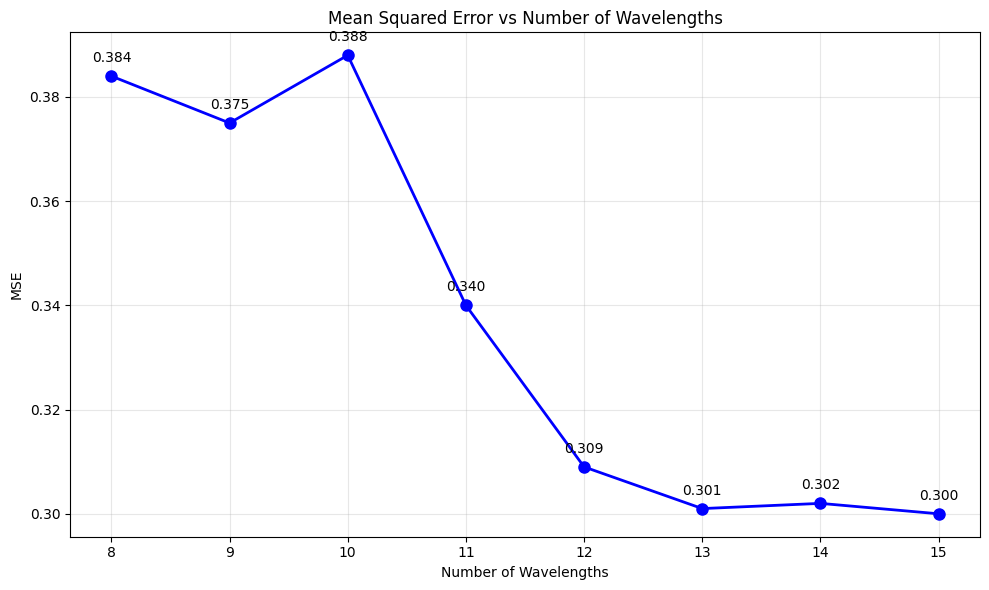

Minimum MSE: 0.300 at 15 wavelengths
Maximum MSE: 0.388 at 10 wavelengths
MSE range: 0.088


In [ ]:
# Plot MSE vs Number of Wavelengths
import matplotlib.pyplot as plt
wl_mse_dict = {
    8: 0.384,
    9: 0.375,
    10: 0.388,
    11: 0.340,
    12: 0.309,
    13: 0.301,
    14: 0.302,
    15: 0.300
}

# Extract data from the dictionary
num_wavelengths = list(wl_mse_dict.keys())
mse_values = list(wl_mse_dict.values())

# Create the line plot
plt.figure(figsize=(10, 6))
plt.plot(num_wavelengths, mse_values, 'bo-', linewidth=2, markersize=8, label='MSE vs Number of Wavelengths')
plt.xlabel('Number of Wavelengths')
plt.ylabel('MSE')
plt.title('Mean Squared Error of Reconstruction vs Number of Wavelengths')
plt.grid(True, alpha=0.3)

# Add value annotations on each point
for i, (x, y) in enumerate(zip(num_wavelengths, mse_values)):
    plt.annotate(f'{y:.3f}', (x, y), textcoords="offset points", xytext=(0,10), ha='center')

# Set x-axis to show all wavelength numbers
plt.xticks(num_wavelengths)
plt.tight_layout()
plt.show()

# Print some statistics
print(f"Minimum MSE: {min(mse_values):.3f} at {num_wavelengths[mse_values.index(min(mse_values))]} wavelengths")
print(f"Maximum MSE: {max(mse_values):.3f} at {num_wavelengths[mse_values.index(max(mse_values))]} wavelengths")
print(f"MSE range: {max(mse_values) - min(mse_values):.3f}")

## 14. Model Comparison

In [ ]:
from src.visualize_data import plot_models_visualization
from src.dataset.concentrations_dataset import Signal

sample_id = "013-01"
model_paths = [
    "../results/models/sweep/helicoid-autoencoder/unet_8_wl_SSIM_weighted_image_norm/silvery-sweep-33",
    "../results/models/sweep/helicoid-autoencoder/unet_9_wl_SSIM_weighted_image_norm/iconic-sweep-4",
    "../results/models/sweep/helicoid-autoencoder/unet_10_wl_SSIM_weighted_image_norm/olive-sweep-28",
    "../results/models/sweep/helicoid-autoencoder/unet_11_wl_SSIM_weighted_image_norm/pretty-sweep-46",
    "../results/models/sweep/helicoid-autoencoder/unet_12_wl_SSIM_weighted_image_norm/bright-sweep-29",
    "../results/models/sweep/helicoid-autoencoder/unet_13_wl_SSIM_weighted_image_norm/gentle-sweep-37",
    "../results/models/sweep/helicoid-autoencoder/unet_14_wl_SSIM_weighted_image_norm/prime-sweep-36",
    "../results/models/sweep/helicoid-autoencoder/unet_15_wl_SSIM_weighted_image_norm/kind-sweep-13",
]
model_names = [
    "8 WL",
    "9 WL",
    "10 WL",
    "11 WL",
    "12 WL",
    "13 WL",
    "14 WL",
    "15 WL"
]
plot_models_visualization(
    sample_id=sample_id,
    model_paths=model_paths,
    signal_or_molecule_idx=Signal.HbT,
    device="cuda:0",
    model_names=model_names,
    figsize=(15, 6),
    cmap="Reds",
)

### Model Comparison per sample

In [ ]:
from src.visualize_data import plot_samples_models_comparison
from src.constants import HELICOID_TEST_SET
from src.dataset.concentrations_dataset import Signal

model_paths = [
    "../results/models/sweep/helicoid-autoencoder/autoencoder_baseline_15_wl/deep-sweep-33",
    "../results/models/sweep/helicoid-autoencoder/unet_15_wl_perceptual_image_norm/eager-sweep-2",
]

model_names = [
    "Autoencoder Baseline",
    "U-Net Perceptual",
]

sample_ids=[
    "008-01",
    "012-01",
    "015-01",
    "016-01",
    "020-01",
    "025-02"
]

plot_samples_models_comparison(
    sample_ids=sample_ids,
    model_paths=model_paths,
    model_names=model_names,
    signal=Signal.HbT,
    device="cuda:0",
    figsize=(16, 2.8)
)

In [ ]:
from src.visualize_data import plot_single_sample_reconstruction_quality
from src.constants import HELICOID_TEST_SET
from src.dataset.concentrations_dataset import Signal

model_paths = [
    "../results/models/sweep/helicoid-autoencoder/autoencoder_baseline_15_wl/deep-sweep-33",
    "../results/models/sweep/helicoid-autoencoder/unet_15_wl_perceptual_image_norm/eager-sweep-2",
]

model_names = [
    "Autoencoder",
    "U-Net",
]


plot_single_sample_reconstruction_quality(
    sample_id="020-01",
    model_paths=model_paths,
    model_names=model_names,
    signal=Signal.diffCCO,
    device="cuda:0",
    figsize=(5, 4)
)